In [2]:
import torch
from torch import nn
import copy
import pickle
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 13})
from collections import defaultdict
import time
import os

#For interactable plots in the notebook.
%matplotlib notebook 

device = 'cuda' #Setting device to cuda. 
#Change to 'cpu' or 'cuda:n', where n is a integer to select specific gpu

torch.set_default_dtype(torch.float64) #setting 64-bit precision for 

def diff(u, t, order : float = 1):
    """
    Implements d^n u/dt^n where n is the order of the derivative.
    """
    ones = torch.ones_like(u)
    der, = torch.autograd.grad(u, t, create_graph=True, grad_outputs=ones, allow_unused=True)
    if der is None:
        return torch.zeros_like(t, requires_grad=True)
    else:
        der.requires_grad_()
    for i in range(1, order):
        ones = torch.ones_like(der)
        der, = torch.autograd.grad(der, t, create_graph=True, grad_outputs=ones, allow_unused=True)
        if der is None:
            return torch.zeros_like(t, requires_grad=True)
        else:
            der.requires_grad_()
    return der

# 1D Examples

In [3]:
class BaseNet(nn.Module):
    '''Base class for PINN'''
    def __init__(self, n_vars, n_outputs=1, **kwargs):
        super().__init__()
        
        self.n_layers = kwargs.get('n_layers', 5) 
        self.n_vars = n_vars
        self.n_outputs = n_outputs
        self.nodes_per_hidden_layer = kwargs.get('nodes_per_hidden_layer', 32)
        self.multi_network = kwargs.get('multi_network', False)
        self.nodes_in_last_layer = kwargs.get('nodes_in_last_layer', self.nodes_per_hidden_layer)
        self.inputs_to_first_layer = kwargs.get('inputs_to_first_layer', n_vars)
        self.activation = kwargs.get('activation',torch.tanh)
        if self.n_layers == 2: self.nodes_per_hidden_layer = self.nodes_in_last_layer = max(self.nodes_per_hidden_layer, self.nodes_in_last_layer)
        self.nodes_in_output_layer = self.n_outputs if self.multi_network == False else 1
        
        output_count = self.n_outputs
        nn_list = []
        while(output_count>0):
            output_count -= 1
            layers = nn.ModuleList()
            for i in range(1, self.n_layers+1):
                if i==1: #First layer
                    layers.append(nn.Linear(self.inputs_to_first_layer, self.nodes_per_hidden_layer))
                elif i==self.n_layers:
                    layers.append(nn.Linear(self.nodes_in_last_layer, self.nodes_in_output_layer, bias=False))
                elif i==self.n_layers-1:
                    layers.append(nn.Linear(self.nodes_per_hidden_layer, self.nodes_in_last_layer))
                else:
                    layers.append(nn.Linear(self.nodes_per_hidden_layer, self.nodes_per_hidden_layer))

            nn_list.append(layers)
            if not self.multi_network: break
        
        if self.n_outputs==1 or not self.multi_network:
            self.layers = layers
            self.nn = self.raw_fn
        else:
            self.nn_list = nn.ModuleList(nn_list)
            self.nn = self.raw_fn_MO #raw_fn with multiple_output
        
        
        
    def jac_raw_fn(self, wb, *var):
        '''A hack to compute Jacobian w.r.t. wb in pytorch'''
        inp = torch.column_stack(var)
        for i, layer in enumerate(self.layers[:-1]):
            w, b = layer.weight, layer.bias 
            if i == self.jac_wrt_layer:
                if self.jac_wrt_bias:
                    inp = self.activation(inp@w.T + wb)
                else:
                    inp = self.activation(inp@wb.T + b)
            else:
                inp = self.activation(inp@w.T + b)     

        #Last Layer is assumed to have no bias.
        if self.jac_wrt_layer == self.n_layers-1:
            out = inp@wb.T
        else:
            out = inp@self.layers[-1].weight.T
        return out
                
    
    def raw_fn(self, *var):
        '''
        Returns raw output from neural network before applying constraints
        '''
        inp = torch.column_stack(var)
        for layer in self.layers[:-1]:
            inp = self.activation(layer(inp))
        
        out = self.layers[-1](inp) 
        return out
    
    def raw_fn_MO(self, *var):
        '''
        If multiple neural networks are used, 
        returns raw output from multiple neural networks applying constraints
        '''
        input = torch.column_stack(var)
        outputs = []
        for layers in self.nn_list:
            inp = input
            for layer in layers[:-1]:
                inp = self.activation(layer(inp))

            out = layers[-1](inp) 
            outputs.append(out)
        return torch.cat(outputs,dim=-1)
        
    def jac(self, layer=-1, bias=False, *var):
        '''
        Computes the jacobian. To be used with extremization.
        '''
        assert self.n_outputs == 1 or self.multi_network == False, 'Jacobian not implemented for multiple network'
        def pde_res(jac_var):
            self.nn = lambda *x: self.jac_raw_fn(jac_var, *x)       
            return self.residual(*var)
            
        if layer < 0: 
            self.jac_wrt_layer = self.n_layers + layer
        else:
            self.jac_wrt_layer = layer
        self.jac_wrt_bias = bias
        jac_var = self.layers[layer].bias if bias == True else self.layers[layer].weight

        jacob = torch.autograd.functional.jacobian(pde_res, jac_var, vectorize = True, strategy='forward-mode')
        self.nn = self.raw_fn #setting evaluation function back to normal
        return jacob
    
    def residual(self, *var):
        '''
        Returns residual after evaluating the ODE or PDE
        '''
        if self.n_outputs>1: #If system of PDEs or ODEs
            temp = torch.cat(self.pde(*self.forward(*var), *var), dim=0)
        else:
            temp = self.pde(self.forward(*var), *var)
        self.res = temp.detach() #storing the residual to access later.
        return temp
    
        
    def forward(self, *var):
        '''
        Implements forward pass for the neural network. 
        Modify this for different ODE/PDE with different boundary conditions
        '''
        t = var[0]
        x = var[1]
        
        t0 = torch.zeros_like(t.detach())
        fn2 = lambda t,x: self.nn(t, x)[:,0] - self.nn(t0, x)[:,0] -b0*(x-x0)**2 + math.log((b0/torch.pi)**0.5)
        return torch.exp(fn2(t,x))
    
    def loss(self, *var):
        '''
        Implements mean square loss on the residual of ODE/PDE
        Modify this to implement other loss functions
        '''
        res = self.residual(*var)
        return torch.mean(res**2)
    
    def error(self, *var, residual=False):
        '''
        If exact solutions are implemented using 'exact' method, returns the mean error and max error.
        '''
        num = self.forward(*var)
        exa = self.exact(*var)
        err = [(i-j) for i,j in zip(num,exa)] if self.n_outputs>1 else (num-exa)
        
        if residual:
            return err
        else:
            err = [i.abs() for i in err] if self.n_outputs>1 else err.abs()
            err_mean = [i.mean() for i in err] if self.n_outputs>1 else err.mean()
            err_max = [i.max() for i in err] if self.n_outputs>1 else err.max()
            return err_mean, err_max
        
    def pde(self, u, t, x):
        '''
        Implements differential equation in the form PDE = 0 or ODE = 0. 
        If a system of PDEs/ODEs, return is of the form (PDE_1, PDE_2, ..., PDE_N)
        '''
        #du/dt - gamma * d(u*x)/dx - D * d^2(u)/dx^2 = 0
        pde = diff(u, t, order=1) - gamma*diff((x)*u, x, order=1) - D*diff(u,x,order=2)
        return pde
    
    

# Function Defintions

In [9]:
def setup_plot():#
    '''Function to initialize realtime RMSE plots'''
    #global g_ax, g_fig, g_line1, g_line2
    g_fig, g_ax = plt.subplots(figsize=(4, 4))
    (g_line1,) = g_ax.plot([1,], [1,])
    (g_line2,) = g_ax.plot([1,], [1,])
    #ax.set_xscale('log')
    g_ax.set_xlabel('Time (min)')
    g_ax.set_ylabel('RMSR')
    g_ax.set_yscale('log')
    g_ax.grid(True, which='minor')
    plt.show(block=False)
    g_fig.canvas.draw()
    return g_ax, g_fig, g_line1, g_line2


def update_plot(data, g_ax, g_fig, g_line1, g_line2):
    '''Function to update realtime RMSE plots'''
    avg_dt = np.mean(data['sgd']['dt'])
    g_line1.set_xdata(np.array(data['sgd']['best_step'])*avg_dt/60)
    g_line2.set_xdata(np.array(data['elm']['best_step'])*avg_dt/60)
    g_line1.set_ydata(data['sgd']['best_rmse'])
    g_line2.set_ydata(data['elm']['best_rmse'])
    g_ax.relim()
    g_ax.autoscale_view(True,True,True)
    g_fig.canvas.draw()
    g_fig.canvas.flush_events()
    
def extremize(emodel, rmse, n_samples=4000, batch_size=2000, iter = False, layer=-1, bias=False, max_iter=10, break_rmse = True, verbose = False, driver = 'gelsd'):
    '''
    Function to Perform Extremization.

    emodel: neural network
    rmse: float, RMSE of emodel.
    n_samples: int, number of samples to use when performing Extremization.
    batch_size: int, batch size, since extremization is memory intensive, need to perform it in batches.
    iter: bool, if True, performs extremization iteratively till RMSE stops decreasing. Required for non-linear problems.
    layer: int, Decides the neural network layer on which extremization is performed. -1 means last layer.
    bias: bool, if True, perform extremization on the bias of a given layer instead of its weights.
    max_iter: int, max iterations when performing iterated extremization.
    break_rmse: bool, if True, stops iteration if RMSE increases compared to previous iteration. Ignore if iter = False.
    verbose: bool, if True, prints RMSE values changes for each iteration. Useful when performing Extremization separate from regular training.
    elm_driver: 'gels', 'gelsd', 'gelsy' or 'gelss'. The specific driver to use when performing Least Squares to perform extremization.
    '''
    emodel.eval()
    wb = emodel.layers[layer].bias if bias == True else emodel.layers[layer].weight
    
    for i in range(max_iter):
        rmse_old = rmse
        wb_copy = wb.detach().clone()
        jac_list, pde_res_list = [], []
        _n_samples, _batch_size = n_samples, batch_size
        while(_n_samples>0):
            if verbose:
                print('\r' + f'{i}:: {_n_samples} ::', end='')
            _batch_size = min(_n_samples, _batch_size)
            _n_samples = _n_samples - _batch_size
            var = get_samples(_batch_size)
            
            jac = emodel.jac(layer, bias, *var).detach()
            jac_list.append(jac)
            pde_res_list.append(emodel.res)

        jac = torch.cat(jac_list, dim=0)
        res = torch.cat(pde_res_list, dim=0)

        if driver == 'gels':
            dwb = -torch.linalg.lstsq(jac.reshape(len(res), -1), res, driver='gels')[0].reshape(*wb.shape)
        elif driver in ['gelsy', 'gelsd', 'gelss']:
            dwb = -torch.linalg.lstsq(jac.reshape(len(res), -1).cpu(), res.cpu(), driver=driver)[0].reshape(*wb.shape).to(device)
        else:
            raise ValueError('invalid driver')

        with torch.no_grad():
            wb += dwb
        var = get_samples(20000)
        #rmse_old = ((torch.mean(res**2))**0.5).item()
        rmse = (emodel.loss(*var).item()**0.5)
        if verbose:
            print(f'{rmse_old:.3e} -> {rmse:.3e}')
        
        if (rmse >= rmse_old) and break_rmse or rmse != rmse: #checking overfit or nan 
            with torch.no_grad():
                wb.copy_(wb_copy)
            return rmse_old
        
        if not iter: break
    return rmse

def closure(var):
        '''
        Function required for using L-BFGS in PyTorch.
        '''
        global m_loss
        optim_lbfgs.zero_grad()
        m_loss = model.loss(*var)
        m_loss.backward()
        return m_loss
    
def setup_params(ODENet, n_layers=3, nodes_per_hidden_layer=32, nodes_in_last_layer=128, lr_adam = 1e-3, lr_lbfgs = 1, **kwargs):
    '''
    Function to setup neural network and parameters for training.

    n_layers: int, number of layers in the neural network.
    nodes_per_hidden_layer: int, number of neurons in each hidden layer.
    nodes_in_last_layer: int, number of neurons in the last layer.
    lr_adam: float, learning for Adam. Ignore if L-BFGS is being used.
    lr_lbfgs: float, learning rate for L-BFGS. Ignore if Adam is being used.
    '''
    #Some variables are defined as global so that the solver can be stopped and restarted.
    global model, optim_adam, optim_lbfgs, lowest_rmse, lowest_extreme_rmse, step, data, mon_var
    model = ODENet(n_layers=n_layers, nodes_per_hidden_layer=nodes_per_hidden_layer, nodes_in_last_layer=nodes_in_last_layer, **kwargs)
    model.to(device)
    
    optim_adam = torch.optim.Adam(list(model.parameters()), lr = lr_adam)
    optim_lbfgs = torch.optim.LBFGS(list(model.parameters()), lr = lr_lbfgs , line_search_fn='strong_wolfe')

    lowest_rmse, step, mon_var = torch.inf, 0, 0
    lowest_extreme_rmse = torch.inf
    
    data = {'sgd': defaultdict(list), 'elm': defaultdict(list), 'n_layers': n_layers, 'nodes_per_hidden_layer':nodes_per_hidden_layer
            , 'nodes_in_last_layer':nodes_in_last_layer, 'lr_adam':lr_adam, 'lr_lbfgs':lr_lbfgs}
    return model

def run_sim(max_step, plot = True, samples=1000, elm_interval=100, elm_samples=2000, elm_batch_size=2000, elm_iter=False, opt='Adam', 
            plot_update_interval=200, elm_max_iter = 5, run_func = None, rmse_target = 1e-20, elm = True, true_rmse=False, elm_driver='gelsd'):
    '''
    Function to iteratively train the neural network.

    max_step: int, max iterations when solving.
    plot: bool, if True plots RMSE in realtime
    plot_update_interval: int, decides after how many iterations plot should be updated.
    samples: int, number of points to sample from the domain while solving. Requires get_sample() function to be defined.
    elm: bool, if True, performs extremization after certain number of iterations.
    elm_interval: int, number of iterations after which extremization should be repeated.
    elm_samples: int, number of points to sample from the domain while performing extremization. Requires get_sample() function to be defined.
    elm_batch_size: int, batch size, since extremization is memory intensive, need to perform it in batches.
    elm_iter: bool, if True, performs extremization iteratively till RMSE stops decreasing. Required for non-linear problems.
    elm_max_iter: int, max iterations when performing iterated extremization.
    opt: 'Adam' or 'LBFGS'
    rmse_target: float, stop iteration once rmse<rmse_target.
    true_rmse: bool, If True, computes rmse with fresh samples of 20,000 datapoints, otherwise use the rmse computed when loss was calcuated.
    elm_driver: 'gels', 'gelsd', 'gelsy' or 'gelss'. The specific driver to use when performing Least Squares to perform extremization.
    run_func: some extra function that need to be executed for every iteration. Can make use of global variables.
    '''
    #Some variables are defined as global so that the solver can be stopped and restarted.
    global step,lowest_rmse, lowest_extreme_rmse, best_model, best_emodel, m_loss, mon_var
    
    if plot: g_ax, g_fig, g_line1, g_line2 = setup_plot()
    model.train()
    t1e=t2e=0
    while(step<max_step):

        t1 = time.perf_counter()

        var = get_samples(samples)

        if opt == 'Adam':
            optim_adam.zero_grad()
            m_loss = model.loss(*var)
            m_loss.backward()
            optim_adam.step()
        elif opt == 'LBFGS':
            optim_lbfgs.step(lambda : closure(var))
        else:
            raise Exception('Unknown optimizer or non implemented.')

        
        if true_rmse:
            var = get_samples(20000)
            pde_res = model.residual(*var).detach()
            rmse = model.loss(*var).item()**0.5
        else:
            rmse = m_loss.item()**0.5
            
        t2 = time.perf_counter()
        
        data['sgd']['rmse'].append(rmse)
        data['sgd']['dt'].append(t2-t1)
        data['sgd']['step'].append(step+1)
        data['sgd']['max_res'].append(model.res.abs().max().item())

        if rmse< lowest_rmse:
            best_model = copy.deepcopy(model)
            lowest_rmse = rmse 
            data['sgd']['best_rmse'].append(rmse)
            data['sgd']['best_step'].append(step+1)


        if step%elm_interval == 0 and elm:
            t1e = time.perf_counter()
            emodel = copy.deepcopy(best_model)
            extreme_rmse = extremize(emodel, lowest_rmse, elm_samples, elm_batch_size, elm_iter, max_iter=elm_max_iter, driver=elm_driver)
            if lowest_extreme_rmse>extreme_rmse:
                lowest_extreme_rmse = extreme_rmse
                best_emodel = copy.deepcopy(emodel)
                data['elm']['best_rmse'].append(extreme_rmse)
                data['elm']['best_step'].append(step+1)

            t2e = time.perf_counter()
            data['elm']['max_res'].append(emodel.res.abs().max().item())
            data['elm']['rmse'].append(extreme_rmse)
            data['elm']['step'].append(step+1)
            data['elm']['dt'].append(t2e-t1e)
            
        if run_func != None:
            run_func()
        if step%plot_update_interval == 0 and plot: 
            update_plot(data, g_ax, g_fig, g_line1, g_line2)
        t2 = time.perf_counter()
        step += 1
        print(f"Monitor: {mon_var}, step: {step}" + \
        f", RMSE: {rmse:.3e}, EX_RMSE: {lowest_extreme_rmse:.3e}, Best_RMSE: {lowest_rmse:.3e}, dt: {(t2-t1)*1000:.0f}ms, dte: {(t2e-t1e)*1000:.0f}ms" + " "*20, end = '\r')
        if rmse<rmse_target: break
    print()

## ODEs

### $y'(t) = -Sin(t), \ y(0) = 1$

In [10]:
def get_samples(n_samples, requires_grad=True):
    t = (torch.rand(n_samples, device=device)*(t_lim[0]-t_lim[1]) + t_lim[1])
    return (t.requires_grad_(requires_grad), )

class ODENet(BaseNet):
    def __init__(self, **kwargs):
        super().__init__(n_vars = 1, **kwargs)
        
    def pde(self, u, t): #defining ODE
        return diff(u,t) + torch.sin(t)
    
    @staticmethod
    def exact(t): #defining exact solution. Required only if you want to compute Errros with in-built methods.
        return torch.cos(t)
    
    def forward(self, t):
        t0 = torch.zeros((1,), device=device) #value for applying initial condition
        t_new = torch.cat([t0,t]) #concatenating so that t and t0 can be evaluated together. Slightly speeds up GPU computations.
        nn_out = self.nn(t_new)[:,0] # neural network output f(t_new)
        out = nn_out[1:]-nn_out[0] + 1 #Applying TFC constraints y(t) = f(t) - f(t_0) +1
        return out

llayer/layers_5_llayer_400_tmax_10.dic


<IPython.core.display.Javascript object>


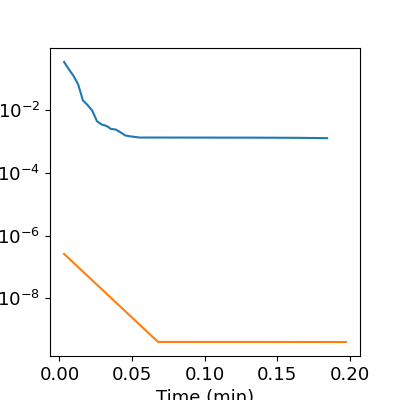

Monitor: 0, step: 100, RMSE: 1.324e-03, EX_RMSE: 4.109e-10, Best_RMSE: 1.264e-03, dt: 101ms, dte: 258ms                    


In [12]:
for n_layers in [5]:
    for tmax in [10]:
        for llayer in [400]:
            setup_params(ODENet,n_layers,32,llayer) #
            t_lim = (0,tmax) #domain
            print(f'llayer/layers_{n_layers}_llayer_{llayer}_tmax_{tmax}.dic')
            run_sim(100, plot = True, elm_batch_size=1000, opt='LBFGS', run_func = None, 
                    elm_interval=20, elm=True, plot_update_interval=10)
            #with open(f'llayer/layers_{n_layers}_llayer_{llayer}_tmax_{tmax}.dic', 'wb') as handle:
             #   pickle.dump(data, handle)

<IPython.core.display.Javascript object>


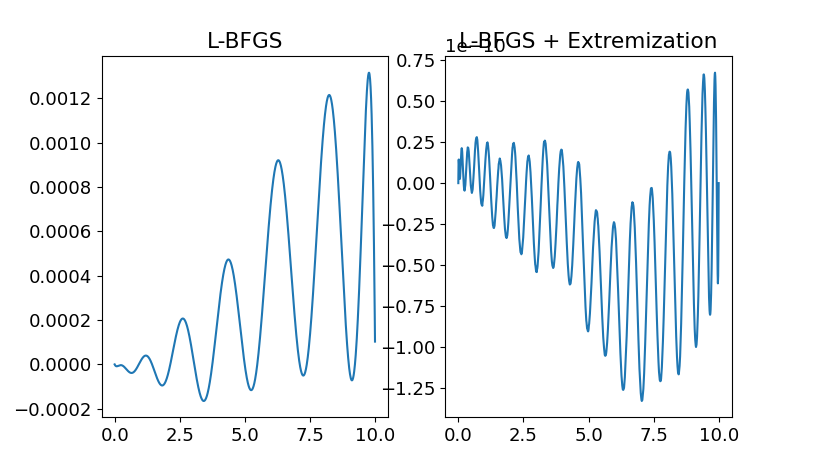

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
t = torch.linspace(*t_lim, 1000, device= device).requires_grad_()
ax[0].plot(t.detach().cpu(), (best_model.exact(t)-best_model(t)).detach().cpu())
ax[1].plot(t.detach().cpu(), (best_model.exact(t)-best_emodel(t)).detach().cpu())
ax[0].title.set_text('L-BFGS')
ax[1].title.set_text('L-BFGS + Extremization')

## Non-linear Coupled ODE

\begin{gathered}
\frac{d}{d t} u=\cos (t)+u^2+v-\left(1+t^2+\sin ^2(t)\right) \\
\frac{d}{d t} v=2 t-\left(1+t^2\right) \sin (t)+u v \\
u(0) = 0 \\
v(0) = 1
\end{gathered}

Analytic Soltuion:

\begin{gathered}
u(t) = \sin(t) \\
v(0) = 1 + t^2
\end{gathered}

In [20]:
def get_samples(n_samples, requires_grad=True):
    t = (torch.rand(n_samples, device=device)*(t_lim[0]-t_lim[1]) + t_lim[1])
    return (t.requires_grad_(requires_grad), )

class CoupledNet(BaseNet):
    def __init__(self, **kwargs):
        super().__init__(n_vars = 1, n_outputs=2, **kwargs)
        
    def pde(self, u, v, t):
        return diff(u,t) - (torch.cos(t) + u**2 + v - (1 + t**2 + torch.sin(t)**2)), diff(v,t) - (2*t - (1+t**2)*torch.sin(t) + u*v)
    
    @staticmethod
    def exact(t):
        return torch.sin(t), 1+t**2

    def forward(self, t):
        t0 = torch.zeros((1,), device=device)
        t_new = torch.cat([t0,t])
        temp = self.nn(t_new)
        
        u_t0 = temp[0,0]
        v_t0 = temp[0,1]
        u_t = temp[1:,0]
        v_t = temp[1:,1]

        #Applying TFC constraints
        u = u_t - u_t0 + 0
        v = v_t - v_t0 + 1

        return u ,v


In [25]:
#Solving just using Extremization
elm_time = []
elm_rmse = []
setup_params(CoupledNet, 2,32,400)
tmax=0.0
elm_model = copy.deepcopy(model)

while(True):
    t1 = time.perf_counter()
    tmax += 0.5
    t_lim = (0,tmax)
    best_elm_model = copy.deepcopy(elm_model)
    rmse = extremize(elm_model, 1, 4000, 400, iter=True, max_iter=100, verbose=False)
    elm_rmse.append(rmse)
    print('Monitor: ', tmax, rmse)
    t2 = time.perf_counter()
    elm_time.append(t2-t1)
    if tmax>=10: break

Monitor:  0.5 1.0110828068482815e-11
Monitor:  1.0 3.865797509404476e-11
Monitor:  1.5 1.5817598393864967e-10
Monitor:  2.0 2.4472604292136905e-10
Monitor:  2.5 1.933960069932244e-10
Monitor:  3.0 6.24149068554839e-10
Monitor:  3.5 3.6317078999561886e-09
Monitor:  4.0 1.0152976197379198e-08
Monitor:  4.5 7.923541373096162e-09
Monitor:  5.0 1.513396770262495e-08
Monitor:  5.5 8.647769943445149e-08
Monitor:  6.0 7.393623437985056e-08
Monitor:  6.5 2.386182502445392e-07
Monitor:  7.0 1.8581633997219656e-07
Monitor:  7.5 1.003104067298276e-06
Monitor:  8.0 3.6684603538574135e-06
Monitor:  8.5 9.735812070646417e-07
Monitor:  9.0 8.554810200265072e-07
Monitor:  9.5 4.268234153013314e-06
Monitor:  10.0 1.0155261173547018e-05


<IPython.core.display.Javascript object>


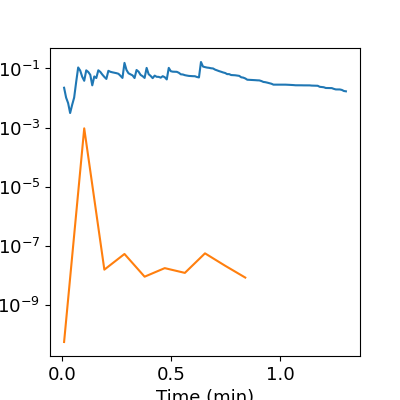

Monitor: t_max: 10.0, step: 150, RMSE: 1.178e-02, EX_RMSE: 8.447e-09, Best_RMSE: 1.178e-02, dt: 585ms, dte: 9378ms                       


In [23]:
def update_tlim():
    '''Function to incrementally increase the domain size when rmse<5e-2'''
    global lowest_rmse, lowest_extreme_rmse, step, t_lim,step, reached
    global mon_var #Value of mon_var will be printed with updates
    if lowest_rmse< 5e-2 and t_lim[1] <10:
        t_lim = (0, t_lim[1]+0.5)
        if t_lim[1] == 10: reached = step
        mon_var = f't_max: {t_lim[1]}'
        lowest_rmse = lowest_extreme_rmse=1e99
        

t_lim=(0, 1.0)
setup_params(CoupledNet, 4,32,400)
run_sim(150, samples=1000, true_rmse=False, opt='LBFGS', elm_samples=4000, elm_iter=True, elm=True, elm_interval=10, elm_batch_size=400, plot_update_interval = 20, run_func=update_tlim, elm_max_iter=100)

<IPython.core.display.Javascript object>


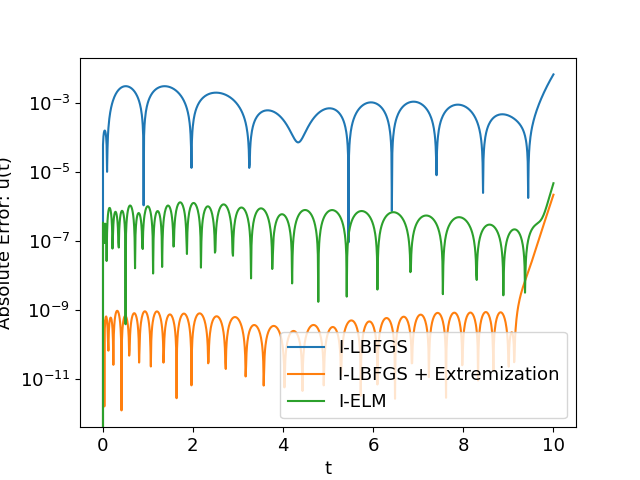

<IPython.core.display.Javascript object>


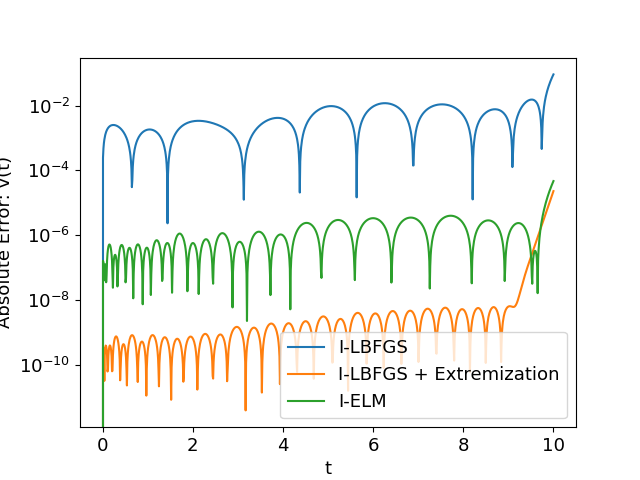

In [27]:

t = torch.linspace(0,10, 1000, device= device).requires_grad_()
with torch.no_grad():
    u_ex, v_ex= best_emodel(t)
    u_b, v_b= best_model(t)
    u_elm, v_elm = elm_model(t)
#uy = best_emodel.residual(t).detach()[:1000]
u_ex, u_b, u_elm = u_ex.cpu(), u_b.cpu(), u_elm.cpu()
v_ex, v_b, v_elm = v_ex.cpu(), v_b.cpu(), v_elm.cpu()
t = t.detach().cpu()
ue, ve = CoupledNet.exact(t)
on=1
plt.figure()
plt.plot(t.cpu(), (u_b-ue*on).abs(), label = 'I-LBFGS')
plt.plot(t.cpu(), (u_ex-ue*on).abs(), label = 'I-LBFGS + Extremization')
plt.plot(t.cpu(), (u_elm-ue*on).abs(), label = 'I-ELM')
#plt.plot(t.cpu(), (v_ex-ve).abs())
plt.yscale('log')
plt.ylabel('Absolute Error: u(t)')
plt.xlabel('t')
plt.legend()

#plt.savefig('plots/layers_3_llayer_400_stiff_u_no_legend.png', dpi=400, bbox_inches='tight')

plt.figure()
plt.plot(t.cpu(), (v_b-ve*on).abs(), label = 'I-LBFGS')
plt.plot(t.cpu(), (v_ex-ve*on).abs(), label = 'I-LBFGS + Extremization')
plt.plot(t.cpu(), (v_elm-ve*on).abs(), label = 'I-ELM')
#plt.plot(t.cpu(), (v_ex-ve).abs())
plt.yscale('log')
plt.ylabel('Absolute Error: v(t)')
plt.xlabel('t')
plt.legend()

#plt.savefig('plots/layers_3_llayer_400_stiff_v_no_legend.png', dpi=400, bbox_inches='tight')

## Linear vs. non-Linear PDE
Linear:
$$\nabla^2 \Psi(x, y)=\left(2-\pi^2 y^2\right) \sin (\pi x)$$

Non-Linear:
$$\nabla^2 \Psi(x, y)+\Psi(x, y) \frac{\partial}{\partial y} \Psi(x, y)=\sin (\pi x)\left(2-\pi^2 y^2+2 y^3 \sin (\pi x)\right)$$

\begin{aligned}
\Psi(0, y) &=0 \\
\Psi(1, y) &=0 \\
\Psi(x, 0) &=0 \\
\frac{\partial}{\partial y} \Psi(x, 1) &=2 \sin (\pi x)
\end{aligned}

Analytic solution:
$$\Psi(x, y)=y^2 \sin (\pi x)$$

In [33]:
def get_samples(n_samples, requires_grad=True):
    t = (torch.rand(n_samples, device=device)*(t_lim[0]-t_lim[1]) + t_lim[1])
    x = (torch.rand(n_samples, device=device)*(x_lim[0]-x_lim[1]) + x_lim[1])
    return (x.requires_grad_(requires_grad), t.requires_grad_(requires_grad))

class PDENet(BaseNet):
    def __init__(self, **kwargs):
        super().__init__(n_vars = 2, **kwargs)
    
    @staticmethod
    def exact(x,y):
        return y**2*torch.sin(torch.pi*x)
    
    def pde(self, u, x, y):
        if is_linear:
            return diff(u,x,2)+diff(u,y,2)-(2-torch.pi**2*y**2)*torch.sin(torch.pi*x)
        else:
            return diff(u,x,2)+diff(u,y,2) + u*diff(u,y) - torch.sin(torch.pi*x)*(2-torch.pi**2*y**2+2*y**3*torch.sin(torch.pi*x))
    
    def forward(self, x, y):
        y0 = torch.zeros_like(y.detach())
        y1 = (torch.zeros_like(y.detach()) + 1).requires_grad_()
        x0 = torch.zeros_like(x.detach())
        x1 = torch.zeros_like(x.detach()) + x_max
        
        #Applying TFC constraints
        fn1 = lambda x,y: self.nn(x,y)[:,0]  - ((x_max-x)*self.nn(x0,y)[:,0]  + x*self.nn(x1,y)[:,0])/x_max
        fn2 = lambda x,y: fn1(x,y) - fn1(x,y0) + y*(2*torch.sin(torch.pi*x) - diff(fn1(x,y1), y1))
        return fn2(x,y)

t_lim=(0,1)
x_max = 1
x_lim=(0,x_max)
is_linear = False #Use Linear PDE if True

In [34]:
#Solving with Extremization
setup_params(PDENet, 2,32,200)
#start = copy.deepcopy(model)
extremize(model, 1, 2000, 400, iter=False, verbose=True, max_iter=100, break_rmse=True, driver='gelsd')
elm_model = copy.deepcopy(model)

0:: 400 :::1.000e+00 -> 3.696e-01


<IPython.core.display.Javascript object>


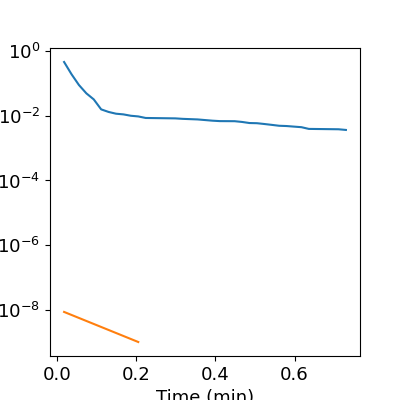

Monitor: 0, step: 40, RMSE: 3.549e-03, EX_RMSE: 1.051e-09, Best_RMSE: 3.549e-03, dt: 972ms, dte: 4370ms                     
CPU times: user 1min 19s, sys: 1.14 s, total: 1min 20s
Wall time: 1min 5s


In [35]:
#Solving with L-BFGS+Extremization
setup_params(PDENet, 3,32,200)
#model= copy.deepcopy(start)
run_sim(40, plot=True, elm_interval = 10, elm_samples=2000, elm_batch_size=400, elm_iter=True, opt='LBFGS', plot_update_interval=2, elm_max_iter=100, elm_driver='gelsd')

In [37]:
import plotly
import plotly.graph_objects as go
plotly.offline.init_notebook_mode(connected=False)
best_model.eval()
best_emodel.eval()
t1 = torch.linspace(*t_lim,100, device='cuda')#.requires_grad_()
x1 = torch.linspace(*x_lim,400, device='cuda')#.requires_grad_()
xt = torch.cartesian_prod(x1,t1)
x, t = xt[:,0].requires_grad_(), xt[:,1].requires_grad_()

best_model.residual(x,t)
best_res = best_model.res.reshape(len(x1),len(t1)).T
best_emodel.residual(x,t)
extreme_res = best_emodel.res.reshape(len(x1),len(t1)).T

p_best = elm_model(x,t).reshape(len(x1),len(t1)).T
p_extreme = best_emodel(x,t).reshape(len(x1),len(t1)).T
p_true = PDENet.exact(x,t).reshape(len(x1),len(t1)).T


#fig2 = go.Figure(data=[go.Surface(z=(p_extreme-p_true).detach().cpu(), x=x1.detach().cpu(), y=t1.detach().cpu())])
fig1 = go.Figure(data=[go.Surface(z=(p_best-p_true).detach().abs().cpu(), x=x1.detach().cpu(), y=t1.detach().cpu())])
fig2 = go.Figure(data=[go.Surface(z=(p_extreme-p_true).abs().detach().cpu()/4.5, x=x1.detach().cpu(), y=t1.detach().cpu(), cmax=1)])
fig3 = go.Figure(data=[go.Surface(z=extreme_res.abs().detach().cpu(), x=x1.detach().cpu(), y=t1.detach().cpu())])
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0, z=0),
    eye=dict(x=-1.25, y=1.25, z=1.25)
)
fig1.update_layout(title=f'Abs Error (Non Extremized)', scene = dict(yaxis_title='y', zaxis_title='', zaxis=dict( type='linear')), autosize=False, width=800, height=800, font=dict(size=14))
fig2.update_layout(title=f'Abs Error (Extremized)', scene = dict(yaxis_title='y', zaxis_title=''), autosize=False, width=800, height=800, font=dict(size=14), scene_camera=camera)
fig3.update_layout(title=f'Residual (Extremized)', scene = dict(yaxis_title='t', zaxis_title=''), autosize=False, width=800, height=800, font=dict(size=14), scene_camera=camera)
#fig1.update_traces(showscale=False)
fig1.show(), fig2.show(), fig3.show()

(None, None, None)

## Kovasznay Solution

\begin{aligned}
&\frac{\partial}{\partial t}\boldsymbol{u} = \boldsymbol{u} \cdot \nabla \boldsymbol{u}-\operatorname{Re}^{-1}  \left(\frac{\partial^2}{\partial x^2}\boldsymbol{u} + \frac{\partial^2}{\partial y^2}\boldsymbol{u} \right) +\nabla p \\
&\nabla \cdot \boldsymbol{u} = 0
\end{aligned}




Analytic solution:
\begin{aligned}
&u_1=1-e^{\lambda x} \cos (2 \pi y) \\
&u_2=\frac{\lambda}{2 \pi} e^{\lambda x} \sin (2 \pi y)\\
&p=p_0-\frac{1}{2} e^{2 \lambda x}\\
&\lambda=\frac{\operatorname{Re}}{2}-\sqrt{\frac{\operatorname{Re}^2}{4}+4 \pi^2}\\
\end{aligned}


In [44]:
import math
def get_samples(n_samples, requires_grad=True):
    x = (torch.rand(n_samples, device=device)*(x_lim[0]-x_lim[1]) + x_lim[1])
    y = (torch.rand(n_samples, device=device)*(y_lim[0]-y_lim[1]) + y_lim[1])
    return x.requires_grad_(requires_grad), y.requires_grad_(requires_grad)

class KovasNet(BaseNet):
    def __init__(self, **kwargs):
        super().__init__(n_vars = 2, n_outputs = 3, **kwargs)
        
    def pde(self, u, v, p, x, y):
        pde1 = u*diff(u,x) + v*diff(u,y)-(diff(u,x,2)+diff(u,y,2))/re + diff(p,x)
        pde2 = v*diff(v,y) + u*diff(v,x)-(diff(v,x,2)+diff(v,y,2))/re + diff(p,y)
        pde3 = diff(u,x) + diff(v,y)
        return pde1, pde2, pde3
    
    @staticmethod
    def exact(x,y):
        return 1 - torch.exp(lamda*x)*torch.cos(2*torch.pi*y), lamda/(2*torch.pi)*torch.exp(lamda*x)*torch.sin(2*torch.pi*y), p0 - 0.5*torch.exp(2*lamda*x)
    
    def forward(self, x, y):
        x1,x2,y1,y2 = x_lim[0], x_lim[1], y_lim[0], y_lim[1]
        x1t = torch.zeros_like(x.detach()) + x1
        x2t = torch.zeros_like(x.detach()) + x2
        y1t = torch.zeros_like(x.detach()) + y1
        y2t = torch.zeros_like(x.detach()) + y2
        
        x_all = torch.cat((x,x1t,x2t,x,x, x1t[:1],x2t[:1], x1t[:1],x2t[:1]))
        y_all = torch.cat((y,y,y,y1t,y2t, y1t[:1],y1t[:1], y2t[:1],y2t[:1]))
        out = self.nn(x_all,y_all)
        u_all, v_all, p_all = out[:,0], out[:,1], out[:,2]
        u_ex_all, v_ex_all, p_ex_all = self.exact(x_all, y_all)
        
        #The following complicated mess is unnecessary. Did to make computations marginally faster.
        l = x.shape[0]
        i = 5*l
        u_x_y, u_x1_y, u_x2_y, u_x_y1, u_x_y2 = u_all[:l], u_all[l:2*l], u_all[2*l:3*l], u_all[3*l:4*l], u_all[4*l:5*l]
        u_x1_y1, u_x2_y1, u_x1_y2, u_x2_y2 = u_all[i:i+1], u_all[i+1:i+2], u_all[i+2:i+3], u_all[i+3:i+4]
        v_x_y, v_x1_y, v_x2_y, v_x_y1, v_x_y2 = v_all[:l], v_all[l:2*l], v_all[2*l:3*l], v_all[3*l:4*l], v_all[4*l:5*l]
        v_x1_y1, v_x2_y1, v_x1_y2, v_x2_y2 = v_all[i:i+1], v_all[i+1:i+2], v_all[i+2:i+3], v_all[i+3:i+4]
        p_x_y, p_x1_y, p_x2_y, p_x_y1, p_x_y2 = p_all[:l], p_all[l:2*l], p_all[2*l:3*l], p_all[3*l:4*l], p_all[4*l:5*l]
        p_x1_y1, p_x2_y1, p_x1_y2, p_x2_y2 = p_all[i:i+1], p_all[i+1:i+2], p_all[i+2:i+3], p_all[i+3:i+4]
        u_ex_x_y, u_ex_x1_y, u_ex_x2_y, u_ex_x_y1, u_ex_x_y2 = u_ex_all[:l], u_ex_all[l:2*l], u_ex_all[2*l:3*l], u_ex_all[3*l:4*l], u_ex_all[4*l:5*l]
        u_ex_x1_y1, u_ex_x2_y1, u_ex_x1_y2, u_ex_x2_y2 = u_ex_all[i:i+1], u_ex_all[i+1:i+2], u_ex_all[i+2:i+3], u_ex_all[i+3:i+4]
        v_ex_x_y, v_ex_x1_y, v_ex_x2_y, v_ex_x_y1, v_ex_x_y2 = v_ex_all[:l], v_ex_all[l:2*l], v_ex_all[2*l:3*l], v_ex_all[3*l:4*l], v_ex_all[4*l:5*l]
        v_ex_x1_y1, v_ex_x2_y1, v_ex_x1_y2, v_ex_x2_y2 = v_ex_all[i:i+1], v_ex_all[i+1:i+2], v_ex_all[i+2:i+3], v_ex_all[i+3:i+4]
        p_ex_x_y, p_ex_x1_y, p_ex_x2_y, p_ex_x_y1, p_ex_x_y2 = p_ex_all[:l], p_ex_all[l:2*l], p_ex_all[2*l:3*l], p_ex_all[3*l:4*l], p_ex_all[4*l:5*l]
        p_ex_x1_y1, p_ex_x2_y1, p_ex_x1_y2, p_ex_x2_y2 = p_ex_all[i:i+1], p_ex_all[i+1:i+2], p_ex_all[i+2:i+3], p_ex_all[i+3:i+4]
        
        #Applying TFC Constraints.
        u_out = u_x_y + ((x - x2)*(u_ex_x1_y - u_x1_y) + (-x + x1)*(u_ex_x2_y - u_x2_y))/(x1 - x2) + (1/(y1 - y2))*((y - y2)*(u_ex_x_y1 - u_x_y1 - \
                (1/(x1 - x2))*((x - x2)*(u_ex_x1_y1 - u_x1_y1) + (-x + x1)*(u_ex_x2_y1 - u_x2_y1))) + (-y + y1)*(u_ex_x_y2 - u_x_y2 - (1/(x1 - x2))* \
                ((x - x2)*(u_ex_x1_y2 - u_x1_y2) + (-x + x1)*(u_ex_x2_y2 - u_x2_y2))))
        v_out = v_x_y + ((x - x2)*(v_ex_x1_y - v_x1_y) + (-x + x1)*(v_ex_x2_y - v_x2_y))/(x1 - x2) + (1/(y1 - y2))*((y - y2)*(v_ex_x_y1 - v_x_y1 - \
                (1/(x1 - x2))*((x - x2)*(v_ex_x1_y1 - v_x1_y1) + (-x + x1)*(v_ex_x2_y1 - v_x2_y1))) + (-y + y1)*(v_ex_x_y2 - v_x_y2 - (1/(x1 - x2))* \
                ((x - x2)*(v_ex_x1_y2 - v_x1_y2) + (-x + x1)*(v_ex_x2_y2 - v_x2_y2))))
        #p_out = p_x_y + ((x - x2)*(p_ex_x1_y - p_x1_y) + (-x + x1)*(p_ex_x2_y - p_x2_y))/(x1 - x2) + (1/(y1 - y2))*((y - y2)*(p_ex_x_y1 - p_x_y1 - \
        #        (1/(x1 - x2))*((x - x2)*(p_ex_x1_y1 - p_x1_y1) + (-x + x1)*(p_ex_x2_y1 - p_x2_y1))) + (-y + y1)*(p_ex_x_y2 - p_x_y2 - (1/(x1 - x2))* \
        #        ((x - x2)*(p_ex_x1_y2 - p_x1_y2) + (-x + x1)*(p_ex_x2_y2 - p_x2_y2))))
        p_out = p_x_y - p_x1_y + p0 - 0.5*math.exp(2*lamda*x1)
        
        return u_out, v_out, p_out
    
class KovasNetReduced(KovasNet):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
    
    def forward(self, x, y):
        
        x1,x2,y1,y2 = x_lim[0], x_lim[1], y_lim[0], y_lim[1]
        x1t = torch.zeros_like(x.detach()) + x1
        x2t = torch.zeros_like(x.detach()) + x2
        y1t = torch.zeros_like(x.detach()) + y1
        y2t = torch.zeros_like(x.detach()) + y2
        
        x_all = torch.cat((x1t,x2t,x,x, x1t[:1],x2t[:1], x1t[:1],x2t[:1]))
        y_all = torch.cat((y,y,y1t,y2t, y1t[:1],y1t[:1], y2t[:1],y2t[:1]))
        

        out = self.nn(x,y) 
        u, v, p = out[:,0], out[:,1], out[:,2]
        
        u_all, v_all, p_all = self.exact(x_all,y_all)
        
        #The following complicated mess is unnecessary. Did to make computations marginally faster.
        l = x.shape[0]
        i = 4*l
        u_x1_y, u_x2_y, u_x_y1, u_x_y2 = u_all[:l], u_all[l:2*l], u_all[2*l:3*l], u_all[3*l:4*l]
        u_x1_y1, u_x2_y1, u_x1_y2, u_x2_y2 = u_all[i:i+1], u_all[i+1:i+2], u_all[i+2:i+3], u_all[i+3:i+4]
        v_x1_y, v_x2_y, v_x_y1, v_x_y2 = v_all[:l], v_all[l:2*l], v_all[2*l:3*l], v_all[3*l:4*l]
        v_x1_y1, v_x2_y1, v_x1_y2, v_x2_y2 = v_all[i:i+1], v_all[i+1:i+2], v_all[i+2:i+3], v_all[i+3:i+4]
        p_x1_y, p_x2_y, p_x_y1, p_x_y2 = p_all[:l], p_all[l:2*l], p_all[2*l:3*l], p_all[3*l:4*l]
        p_x1_y1, p_x2_y1, p_x1_y2, p_x2_y2 = p_all[i:i+1], p_all[i+1:i+2], p_all[i+2:i+3], p_all[i+3:i+4]
        
        u_bou = (1/((x1 - x2)*(y1 - y2)))*((y1 - y2)*((x - x2)*u_x1_y + (-x + x1)*u_x2_y) + (y - y2)*((x1 - x2)*u_x_y1 +\
                (-x + x2)*u_x1_y1 + (x - x1)*u_x2_y1) - (y - y1)*((x1 - x2)*u_x_y2 + (-x + x2)*u_x1_y2 + (x - x1)*u_x2_y2))
        v_bou = (1/((x1 - x2)*(y1 - y2)))*((y1 - y2)*((x - x2)*v_x1_y + (-x + x1)*v_x2_y) + (y - y2)*((x1 - x2)*v_x_y1 +\
                (-x + x2)*v_x1_y1 + (x - x1)*v_x2_y1) - (y - y1)*((x1 - x2)*v_x_y2 + (-x + x2)*v_x1_y2 + (x - x1)*v_x2_y2))
        
        #Applying Reduced TFC Constraints
        u_out = u*(x-x1)*(x-x2)*(y-y1)*(y-y2) + u_bou
        v_out = v*(x-x1)*(x-x2)*(y-y1)*(y-y2) + v_bou
        p_out = p*(x-x1) + p0 - 0.5*math.exp(2*lamda*x1)
        
        return u_out, v_out, p_out
    

        
p0 =1
re = 40
lamda = re/2 - (re**2/4 + 4*torch.pi**2)**0.5
x_lim = (-0.5,1.5)
y_lim = (-0.5,1.0)

In [39]:
%%time
#Solving with Extremization
setup_params(KovasNetReduced, 2,32,400)
extremize(model, 100, 3000, 100, iter=True, verbose=True, max_iter=100, break_rmse=True, driver='gelsd')
elm_model = copy.deepcopy(model)

0:: 100 :::1.000e+02 -> 9.252e-02
1:: 100 :::9.252e-02 -> 4.655e-03
2:: 100 :::4.655e-03 -> 6.764e-04
3:: 100 :::6.764e-04 -> 6.662e-04
4:: 100 :::6.662e-04 -> 6.517e-04
5:: 100 :::6.517e-04 -> 6.521e-04
CPU times: user 3min 51s, sys: 15.9 s, total: 4min 7s
Wall time: 1min 46s


<IPython.core.display.Javascript object>


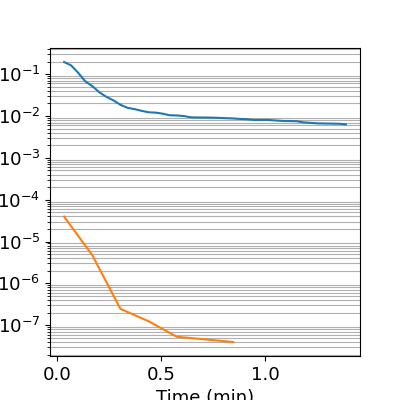

Monitor: 0, step: 41, RMSE: 6.325e-03, EX_RMSE: 3.983e-08, Best_RMSE: 6.325e-03, dt: 176458ms, dte: 174352ms                    


In [45]:
#Solving with L-BFGS+Extremization
prev_low = 1 # temp variable to be used in the following function
def add_data():
    '''Function to store some extra data when training'''
    global best_emodel, step, data, lowest_extreme_rmse, prev_low
    if prev_low != lowest_extreme_rmse:
        var = get_samples(20000)
        err_mean, err_max = best_emodel.error(*var)
        u_err_mean, v_err_mean, p_err_mean = err_mean
        u_err_max, v_err_max, p_err_max = err_max
        data['elm']['u_err'].append(u_err_mean.item())
        data['elm']['u_max_err'].append(u_err_max.item())
        data['elm']['v_err'].append(v_err_mean.item())
        data['elm']['v_max_err'].append(v_err_max.item())
        data['elm']['p_err'].append(p_err_mean.item())
        data['elm']['p_max_err'].append(p_err_max.item())
        prev_low =lowest_extreme_rmse
        
setup_params(KovasNetReduced, 4,32,400)
run_sim(41, plot=True, elm_interval = 4, samples=2000, elm_samples=3000, elm_batch_size=100, elm=True, elm_iter=True, opt='LBFGS', plot_update_interval=2, elm_max_iter=100, run_func = add_data, elm_driver='gelsd')
#model1= copy.deepcopy(best_emodel)
#data1 = data
#use data1 to create plots